In [ ]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All"
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/car-object-detection/data/sample_submission.csv
/kaggle/input/car-object-detection/data/train_solution_bounding_boxes (1).csv
/kaggle/input/car-object-detection/data/testing_images/vid_5_26420.jpg
/kaggle/input/car-object-detection/data/testing_images/vid_5_31520.jpg
/kaggle/input/car-object-detection/data/testing_images/vid_5_29420.jpg
/kaggle/input/car-object-detection/data/testing_images/vid_5_31720.jpg
/kaggle/input/car-object-detection/data/testing_images/vid_5_26560.jpg
/kaggle/input/car-object-detection/data/testing_images/vid_5_27840.jpg
/kaggle/input/car-object-detection/data/testing_images/vid_5_28560.jpg
/kaggle/input/car-object-detection/data/testing_images/vid_5_28360.jpg
/kaggle/input/car-object-detection/data/testing_images/vid_5_25240.jpg
/kaggle/input/car-object-detection/data/testing_images/vid_5_29560.jpg
/kaggle/input/car-object-detection/data/testing_images/vid_5_29020.jpg
/kaggle/input/car-object-detection/data/testing_images/vid_5_30720.jpg
/kaggle/

In [ ]:
!pip install ultralytics


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 896.9/896.9 kB 15.5 MB/s eta 0:00:00a 0:00:01


In [ ]:
!pip install -U ipywidgets
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from glob import glob
import cv2
from PIL import Image
from ultralytics import YOLO
import os

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 139.8/139.8 kB 3.3 MB/s eta 0:00:00a 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 214.4/214.4 kB 7.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.3/2.3 MB 44.7 MB/s eta 0:00:0000:01
  Attempting uninstall: widgetsnbextension
    Found existing installation: widgetsnbextension 3.6.9
    Uninstalling widgetsnbextension-3.6.9:
      Successfully uninstalled widgetsnbextension-3.6.9
  Attempting uninstall: jupyterlab-widgets
    Found existing installation: jupyterlab_widgets 3.0.11
    Uninstalling jupyterlab_widgets-3.0.11:
      Successfully uninstalled jupyterlab_widgets-3.0.11
  Attempting uninstall: ipywidgets
    Found existing installation: ipywidgets 7.7.1
    Uninstalling ipywidgets-7.7.1:
      Successfully uninstalled ipywidgets-7.7.1
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
big

In [ ]:
!mkdir -p "/kaggle/working/data"
!mkdir -p "/kaggle/working/data/images"
!mkdir -p "/kaggle/working/data/images/train"
!mkdir -p "/kaggle/working/data/images/val"
!mkdir -p "/kaggle/working/data/labels"
!mkdir -p "/kaggle/working/data/labels/train"
!mkdir -p "/kaggle/working/data/labels/val"

root_dir = "/kaggle/working/data"
labels_dir = "/kaggle/working/data/labels"
images_dir = "/kaggle/working/data/images"

In [ ]:
train_data = "/kaggle/input/car-object-detection/data/training_images"
csv_data = "/kaggle/input/car-object-detection/data/train_solution_bounding_boxes (1).csv"
test_data = "/kaggle/input/car-object-detection/data/testing_images"

In [ ]:
df = pd.read_csv(csv_data)
df.head()

,image,xmin,ymin,xmax,ymax
0,vid_4_1000.jpg,281.259045,187.035071,327.727931,223.225547
1,vid_4_10000.jpg,15.163531,187.035071,120.329957,236.430180
2,vid_4_10040.jpg,239.192475,176.764801,361.968162,236.430180
3,vid_4_10020.jpg,496.483358,172.363256,630.020260,231.539575
4,vid_4_10060.jpg,16.630970,186.546010,132.558611,238.386422


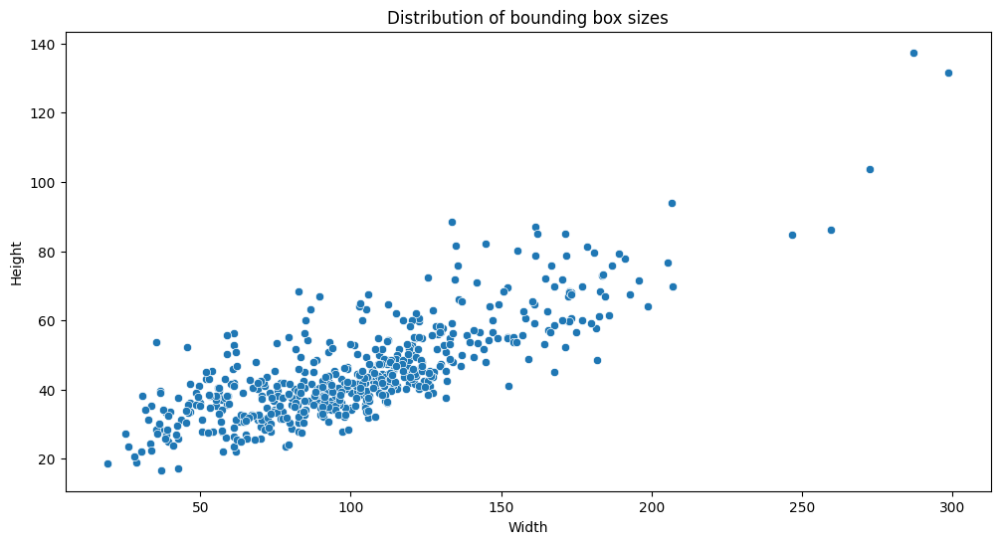

In [ ]:
plt.figure(figsize=(12, 6))
df['width'] = df['xmax'] - df['xmin']
df['height'] = df['ymax'] - df['ymin']
sns.scatterplot(x='width', y='height', data=df)
plt.title('Distribution of bounding box sizes')
plt.xlabel('Width')
plt.ylabel('Height')
plt.show()

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


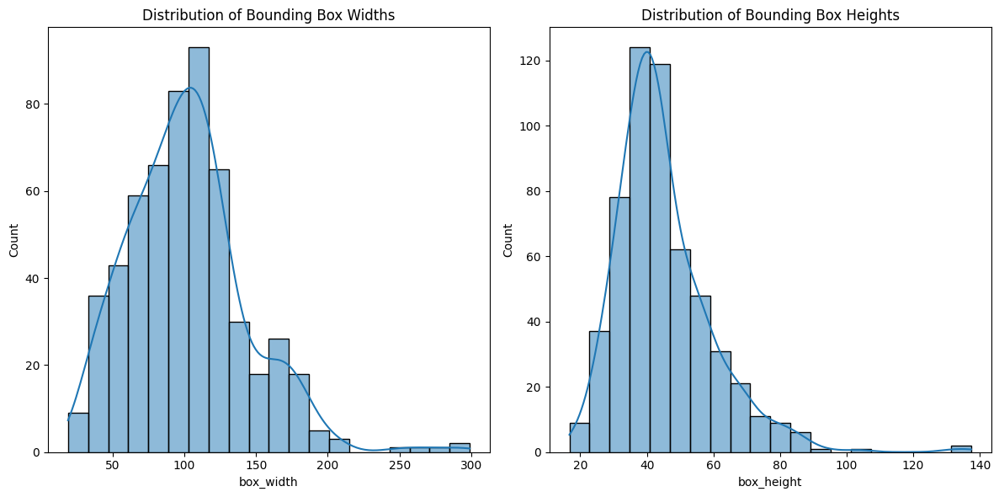

In [ ]:
df['box_width'] = df['xmax'] - df['xmin']
df['box_height'] = df['ymax'] - df['ymin']

plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
sns.histplot(df['box_width'], bins=20, kde=True)
plt.title('Distribution of Bounding Box Widths')

plt.subplot(1, 2, 2)
sns.histplot(df['box_height'], bins=20, kde=True)
plt.title('Distribution of Bounding Box Heights')

plt.tight_layout();
plt.show();

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


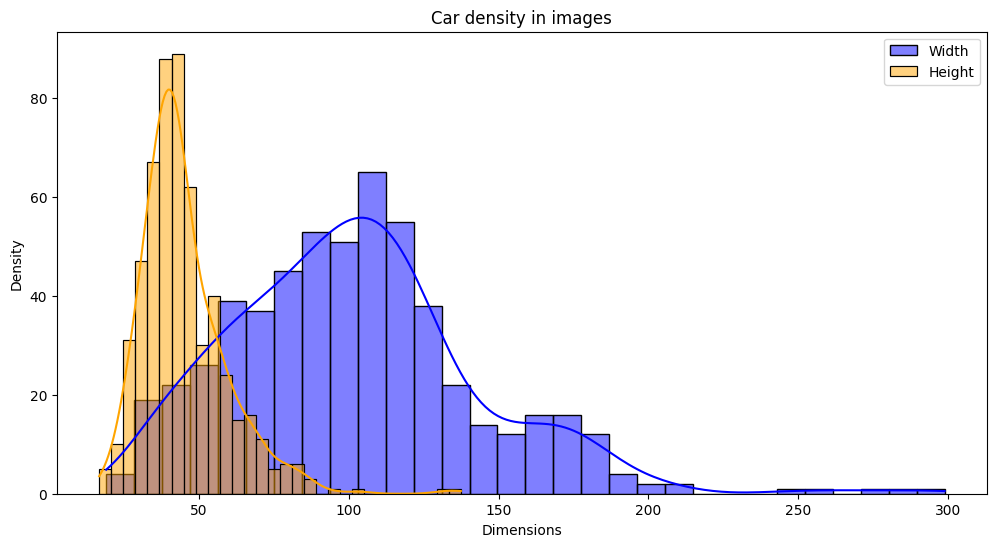

In [ ]:
plt.figure(figsize=(12, 6))
sns.histplot(df['width'], bins=30, kde=True, color='blue', label='Width')
sns.histplot(df['height'], bins=30, kde=True, color='orange', label='Height')
plt.title('Car density in images')
plt.xlabel('Dimensions')
plt.ylabel('Density')
plt.legend()
plt.show()

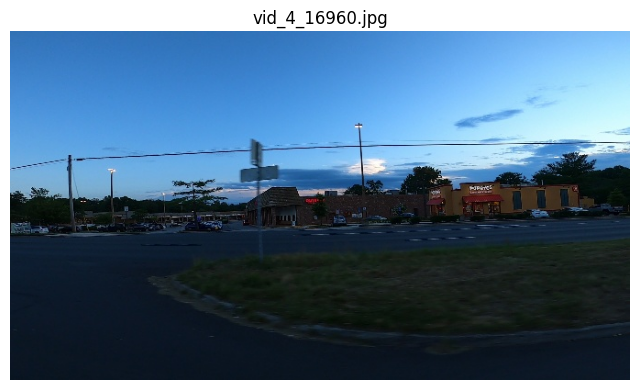

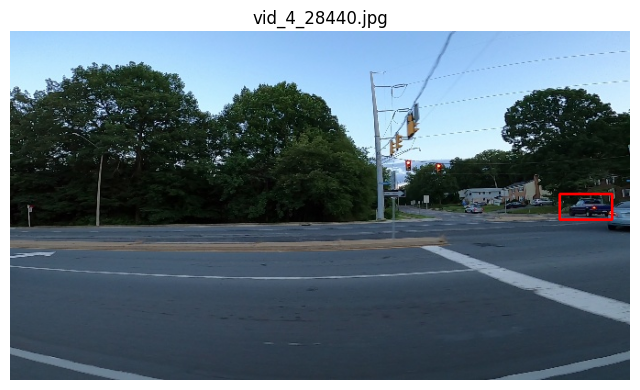

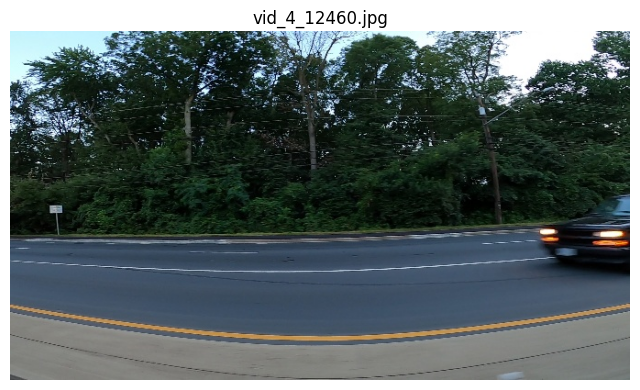

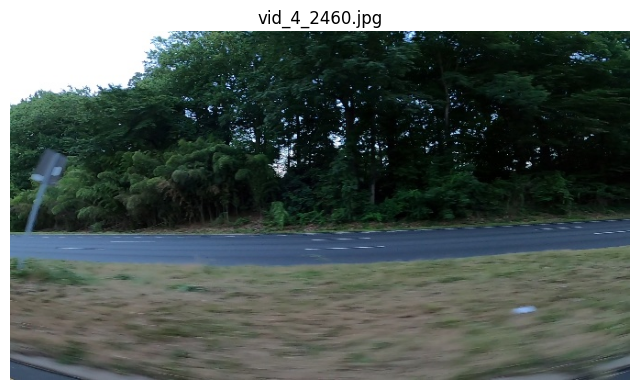

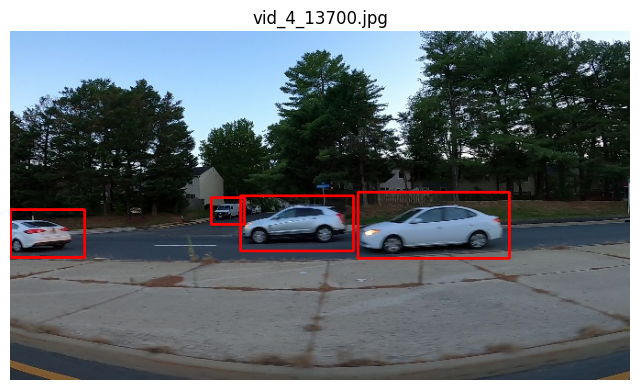

...

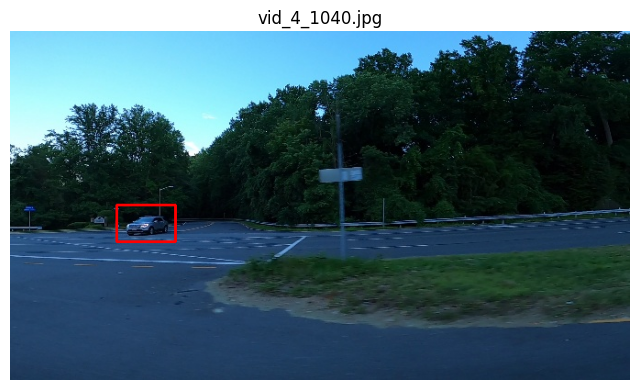

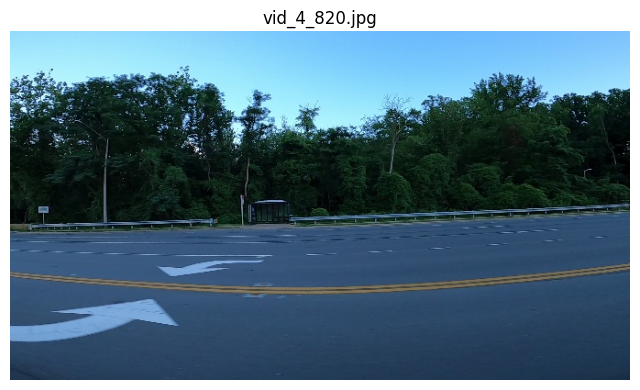

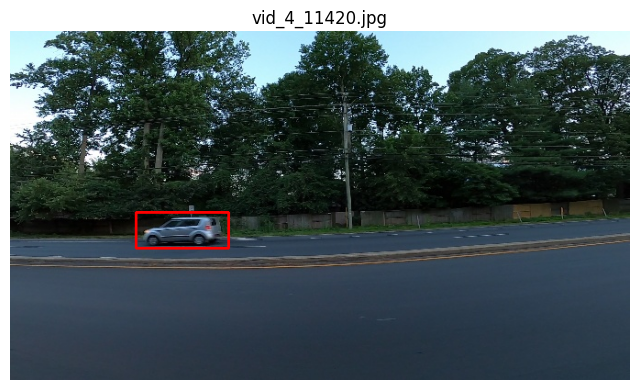

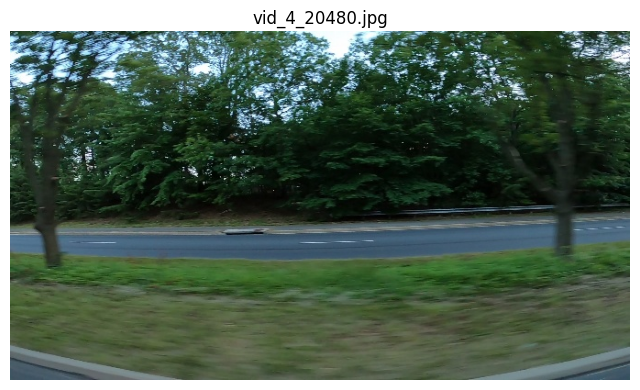

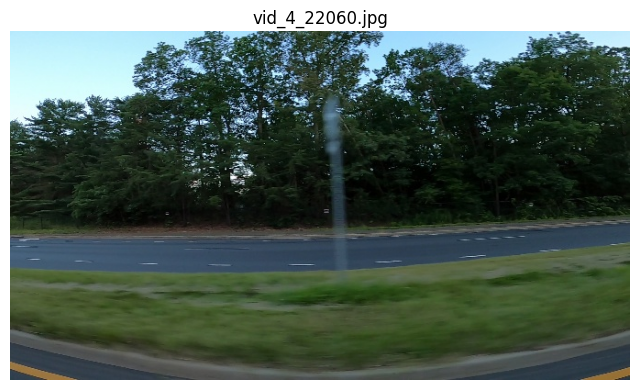

In [ ]:
def plot_images_with_boxes(image_path, df, n=12):
    images = glob(f'{image_path}/*.jpg')[:n]
    for img_path in images:
        img = cv2.imread(img_path)
        img_name = os.path.basename(img_path)
        boxes = df[df['image'] == img_name]

        for _, box in boxes.iterrows():
            cv2.rectangle(img,
                          (int(box['xmin']), int(box['ymin'])),
                          (int(box['xmax']), int(box['ymax'])),
                          (0,0,255),2)

        plt.figure(figsize=(8, 8))
        plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        plt.title(img_name)
        plt.axis('off')
        plt.show()
plot_images_with_boxes(train_data, df)

* # **3- Preparing the Dataset for YOLO¶
# **

In [ ]:
def create_yolo_annotation(row, img_width, img_height):
    x_center = ((row['xmin'] + row['xmax']) / 2) / img_width
    y_center = ((row['ymin'] + row['ymax']) / 2) / img_height
    width = (row['xmax'] - row['xmin']) / img_width
    height = (row['ymax'] - row['ymin']) / img_height
    return f"0 {x_center} {y_center} {width} {height}"

In [ ]:
for img_name in df['image'].unique():
    img_df = df[df['image'] == img_name]
    img_path = os.path.join(train_data,img_name)
    img = cv2.imread(img_path)
    if img is not None:
        img_height, img_width = img.shape[:2]

        if np.random.rand() < 0.8:
            subset = "train"
        else:
            subset = "val"

        dst_img_path = os.path.join(images_dir, subset, img_name)
        cv2.imwrite(dst_img_path, img)

        annotation_path = os.path.join(labels_dir, subset, f"{img_name.split('.')[0]}.txt")
        with open(annotation_path, 'w') as f:
            for _, row in img_df.iterrows():
                yolo_annotation = create_yolo_annotation(row, img_width, img_height)
                f.write(yolo_annotation + '\n')

In [ ]:
yaml_content = f"""
path: {root_dir}
train: images/train
val: images/val

nc: 1
names: ['car']
"""
with open('car_detection.yaml', 'w') as f:
    f.write(yaml_content)
print("YAML configuration file created.")

YAML configuration file created.


In [ ]:
model = YOLO('yolov8s.pt')

100%|██████████| 21.5M/21.5M [00:00<00:00, 109MB/s] 


In [ ]:
results = model.train(
    data='car_detection.yaml',
    epochs=33,
    imgsz=640,
    batch=16,
    name='car_detection_model'
)

Ultralytics 8.3.39 🚀 Python-3.10.14 torch-2.4.0 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=yolov8s.pt, data=car_detection.yaml, epochs=33, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=car_detection_model, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show_boxes

100%|██████████| 755k/755k [00:00<00:00, 16.1MB/s]
2024-12-01 01:26:08,619	INFO util.py:124 -- Outdated packages:
  ipywidgets==7.7.1 found, needs ipywidgets>=8
Run `pip install -U ipywidgets`, then restart the notebook server for rich notebook output.
2024-12-01 01:26:09,300	INFO util.py:124 -- Outdated packages:
  ipywidgets==7.7.1 found, needs ipywidgets>=8
Run `pip install -U ipywidgets`, then restart the notebook server for rich notebook output.


Overriding model.yaml nc=80 with nc=1

                   from  n    params  module                                       arguments                     
  0                  -1  1       928  ultralytics.nn.modules.conv.Conv             [3, 32, 3, 2]                 
  1                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  2                  -1  1     29056  ultralytics.nn.modules.block.C2f             [64, 64, 1, True]             
  3                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  4                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  5                  -1  1    295424  ultralytics.nn.modules.conv.Conv             [128, 256, 3, 2]              
  6                  -1  2    788480  ultralytics.nn.modules.block.C2f             [256, 256, 2, True]           
  7                  -1  1   1180672  ultralytics

100%|██████████| 5.35M/5.35M [00:00<00:00, 68.2MB/s]


AMP: checks passed ✅


train: Scanning /kaggle/working/data/labels/train... 280 images, 0 backgrounds, 0 corrupt: 100%|██████████| 280/280 [00:00<00:00, 1142.69it/s]

train: New cache created: /kaggle/working/data/labels/train.cache


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


/opt/conda/lib/python3.10/site-packages/albumentations/__init__.py:13: UserWarning: A new version of Albumentations is available: 1.4.21 (you have 1.4.17). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()
/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
val: Scanning /kaggle/working/data/labels/val... 75 images, 0 backgrounds, 0 corrupt: 100%|██████████| 75/75 [00:00<00:00, 996.07it/s]

val: New cache created: /kaggle/working/data/labels/val.cache


Plotting labels to runs/detect/car_detection_model/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/car_detection_model
Starting training for 33 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/33      4.07G      1.601      2.561      1.254         26        640: 100%|██████████| 18/18 [00:06<00:00,  2.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.56it/s]


                   all         75        119       0.89      0.886      0.946      0.529

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/33      4.05G      1.315      1.016      1.106         31        640: 100%|██████████| 18/18 [00:04<00:00,  4.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  6.85it/s]

                   all         75        119      0.823      0.898      0.834      0.476



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/33      4.05G      1.316     0.8323      1.139         22        640: 100%|██████████| 18/18 [00:04<00:00,  4.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  6.85it/s]

                   all         75        119      0.914      0.806      0.902      0.547



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/33         4G      1.261     0.7743      1.113         24        640: 100%|██████████| 18/18 [00:04<00:00,  4.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  6.65it/s]

                   all         75        119      0.895      0.933      0.967      0.608



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/33      4.02G      1.272     0.7874      1.108         18        640: 100%|██████████| 18/18 [00:04<00:00,  4.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  6.88it/s]

                   all         75        119      0.736      0.756      0.799      0.464



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/33      4.06G      1.267     0.7414      1.113         13        640: 100%|██████████| 18/18 [00:04<00:00,  4.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.20it/s]

                   all         75        119      0.842      0.854      0.905      0.554



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/33      3.86G      1.272     0.6929      1.105         26        640: 100%|██████████| 18/18 [00:04<00:00,  4.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  6.71it/s]

                   all         75        119      0.969      0.857      0.962      0.615



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/33      3.88G      1.258     0.6709       1.12         18        640: 100%|██████████| 18/18 [00:04<00:00,  4.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  6.69it/s]

                   all         75        119      0.891      0.866      0.929      0.587



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/33         4G      1.262     0.6681      1.129         14        640: 100%|██████████| 18/18 [00:04<00:00,  4.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  6.95it/s]

                   all         75        119      0.931      0.941      0.965      0.623



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/33      4.02G      1.266     0.6438      1.117         36        640: 100%|██████████| 18/18 [00:04<00:00,  4.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  6.95it/s]

                   all         75        119      0.933      0.818      0.928      0.537



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/33      3.86G      1.225     0.6295      1.116         30        640: 100%|██████████| 18/18 [00:04<00:00,  4.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  6.77it/s]

                   all         75        119      0.881      0.934      0.952      0.559



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/33      3.87G      1.201     0.6099      1.097         30        640: 100%|██████████| 18/18 [00:04<00:00,  4.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.14it/s]

                   all         75        119      0.918      0.941      0.977       0.63



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/33         4G      1.157     0.6113      1.075         38        640: 100%|██████████| 18/18 [00:04<00:00,  4.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  6.59it/s]

                   all         75        119      0.941      0.934      0.979      0.621



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/33      4.03G      1.213     0.5918      1.093         28        640: 100%|██████████| 18/18 [00:04<00:00,  4.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.23it/s]

                   all         75        119      0.974      0.936      0.983      0.637



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/33      3.84G      1.145     0.5861      1.081         23        640: 100%|██████████| 18/18 [00:04<00:00,  4.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.05it/s]

                   all         75        119      0.959      0.978      0.992      0.662



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/33      3.89G      1.167     0.5854      1.065         30        640: 100%|██████████| 18/18 [00:04<00:00,  4.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.15it/s]

                   all         75        119      0.964      0.975       0.99      0.666



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/33      4.02G      1.163     0.5748       1.07         33        640: 100%|██████████| 18/18 [00:04<00:00,  4.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  6.73it/s]

                   all         75        119      0.974      0.962       0.99       0.65



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/33      4.02G      1.131      0.539      1.061         19        640: 100%|██████████| 18/18 [00:04<00:00,  4.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.02it/s]

                   all         75        119      0.949      0.966      0.985      0.663



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/33      3.86G      1.105      0.534      1.039         20        640: 100%|██████████| 18/18 [00:04<00:00,  4.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  6.99it/s]

                   all         75        119       0.95      0.963      0.982      0.658



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/33      3.89G      1.073     0.5258      1.043         24        640: 100%|██████████| 18/18 [00:04<00:00,  4.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  6.94it/s]

                   all         75        119      0.934      0.958      0.983       0.68



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/33      4.02G      1.054     0.5166      1.031         23        640: 100%|██████████| 18/18 [00:04<00:00,  3.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  6.91it/s]

                   all         75        119      0.956      0.958      0.981      0.655



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/33      4.04G      1.083     0.5161      1.035         16        640: 100%|██████████| 18/18 [00:04<00:00,  3.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.04it/s]

                   all         75        119      0.966      0.965      0.984      0.658



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/33      4.02G      1.071     0.5151       1.04         21        640: 100%|██████████| 18/18 [00:04<00:00,  3.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.12it/s]

                   all         75        119      0.982      0.939      0.983       0.68


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/33      3.87G       1.08     0.5273       1.06          9        640: 100%|██████████| 18/18 [00:05<00:00,  3.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  6.60it/s]

                   all         75        119      0.966       0.96      0.985      0.639



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/33         4G      1.085     0.5085      1.052         11        640: 100%|██████████| 18/18 [00:04<00:00,  3.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  6.49it/s]

                   all         75        119      0.938      0.958      0.983      0.641



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/33      3.87G      1.072     0.4913      1.043         12        640: 100%|██████████| 18/18 [00:04<00:00,  3.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  6.06it/s]

                   all         75        119      0.963      0.975      0.985      0.661



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/33      3.84G      1.056     0.4884      1.042         13        640: 100%|██████████| 18/18 [00:04<00:00,  3.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.20it/s]

                   all         75        119      0.983      0.975      0.987      0.658



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/33      4.02G      1.069     0.4784       1.04         18        640: 100%|██████████| 18/18 [00:04<00:00,  3.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.08it/s]

                   all         75        119      0.979       0.95      0.989      0.676



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/33      3.84G     0.9973     0.4662      1.021         15        640: 100%|██████████| 18/18 [00:04<00:00,  4.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  6.79it/s]

                   all         75        119      0.968      0.975      0.989      0.673



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/33      3.87G     0.9972     0.4694      1.014         14        640: 100%|██████████| 18/18 [00:04<00:00,  4.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.11it/s]

                   all         75        119      0.969      0.966       0.99      0.687



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/33         4G     0.9863     0.4512      1.012         12        640: 100%|██████████| 18/18 [00:04<00:00,  4.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.09it/s]

                   all         75        119      0.975      0.974       0.99      0.683



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/33      3.86G     0.9682     0.4345      1.016          9        640: 100%|██████████| 18/18 [00:04<00:00,  3.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.27it/s]

                   all         75        119      0.964      0.975       0.99      0.687



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/33         4G     0.9646     0.4429      1.003         12        640: 100%|██████████| 18/18 [00:04<00:00,  4.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.01it/s]

                   all         75        119      0.964      0.975      0.991       0.69



33 epochs completed in 0.055 hours.
Optimizer stripped from runs/detect/car_detection_model/weights/last.pt, 22.5MB
Optimizer stripped from runs/detect/car_detection_model/weights/best.pt, 22.5MB

Validating runs/detect/car_detection_model/weights/best.pt...
Ultralytics 8.3.39 🚀 Python-3.10.14 torch-2.4.0 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 168 layers, 11,125,971 parameters, 0 gradients, 28.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.50it/s]


                   all         75        119      0.964      0.975      0.991       0.69
Speed: 0.2ms preprocess, 2.5ms inference, 0.0ms loss, 1.4ms postprocess per image
Results saved to runs/detect/car_detection_model


In [ ]:
results = model.val()
print(results)

Ultralytics 8.3.39 🚀 Python-3.10.14 torch-2.4.0 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 168 layers, 11,125,971 parameters, 0 gradients, 28.4 GFLOPs


val: Scanning /kaggle/working/data/labels/val.cache... 75 images, 0 backgrounds, 0 corrupt: 100%|██████████| 75/75 [00:00<?, ?it/s]
/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  4.43it/s]


                   all         75        119      0.964      0.975      0.991      0.689
Speed: 0.2ms preprocess, 7.4ms inference, 0.0ms loss, 1.5ms postprocess per image
Results saved to runs/detect/car_detection_model2
ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x79235832b910>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.03

In [ ]:
print(f"Mean Average Precision @.5:.95 : {results.box.map}")
print(f"Mean Average Precision @ .50   : {results.box.map50}")
print(f"Mean Average Precision @ .70   : {results.box.map75}")

Mean Average Precision @.5:.95 : 0.6892217305794763
Mean Average Precision @ .50   : 0.9909533454475616
Mean Average Precision @ .70   : 0.8166485643063628



image 1/1 /kaggle/input/car-object-detection/data/testing_images/vid_5_26420.jpg: 384x640 (no detections), 44.9ms
Speed: 2.0ms preprocess, 44.9ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)


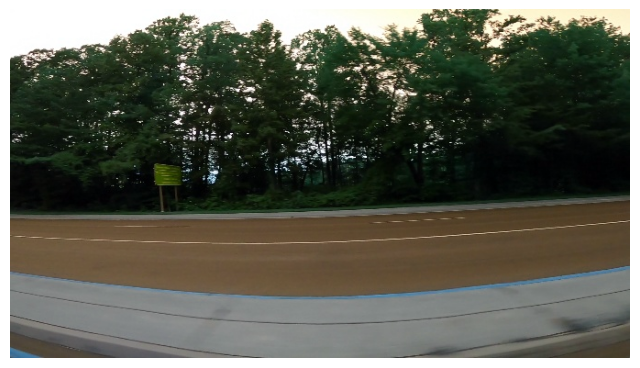


image 1/1 /kaggle/input/car-object-detection/data/testing_images/vid_5_31520.jpg: 384x640 (no detections), 10.7ms
Speed: 2.0ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)


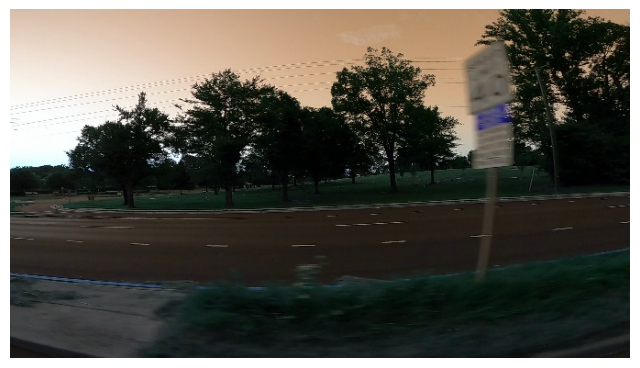


image 1/1 /kaggle/input/car-object-detection/data/testing_images/vid_5_29420.jpg: 384x640 2 cars, 10.7ms
Speed: 1.9ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)


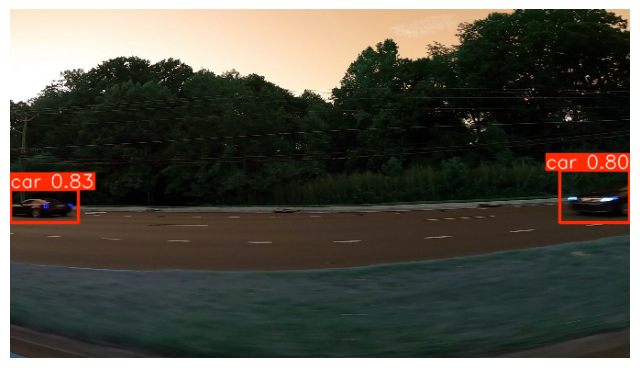


image 1/1 /kaggle/input/car-object-detection/data/testing_images/vid_5_31720.jpg: 384x640 1 car, 10.7ms
Speed: 1.7ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)


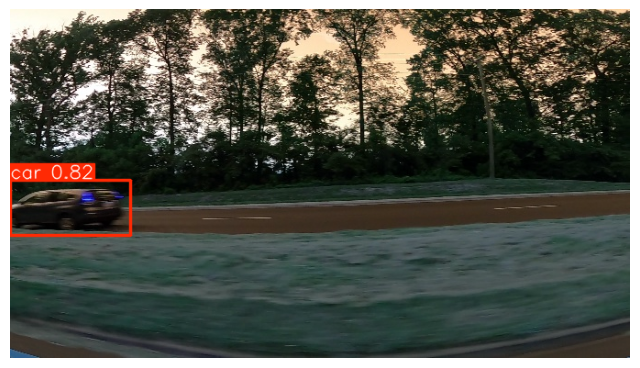


image 1/1 /kaggle/input/car-object-detection/data/testing_images/vid_5_26560.jpg: 384x640 1 car, 10.7ms
Speed: 1.9ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)


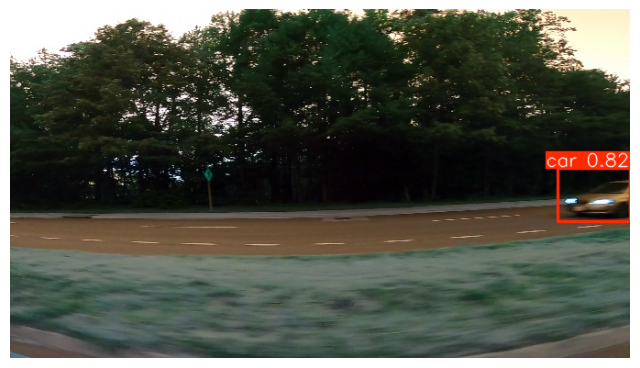


image 1/1 /kaggle/input/car-object-detection/data/testing_images/vid_5_27840.jpg: 384x640 1 car, 10.8ms
Speed: 1.9ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)


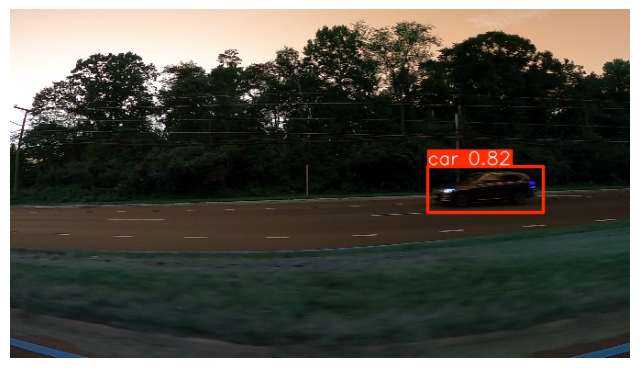


image 1/1 /kaggle/input/car-object-detection/data/testing_images/vid_5_28560.jpg: 384x640 (no detections), 10.7ms
Speed: 1.7ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)


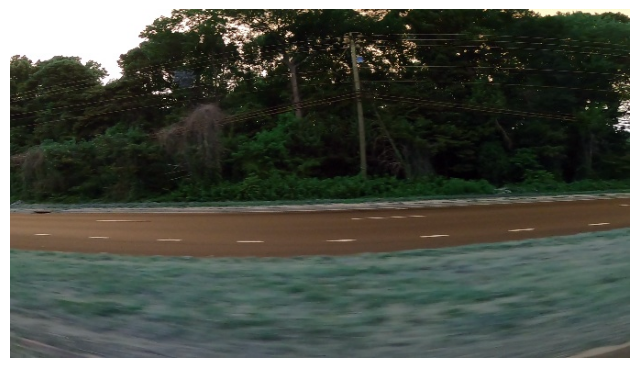


image 1/1 /kaggle/input/car-object-detection/data/testing_images/vid_5_28360.jpg: 384x640 (no detections), 10.7ms
Speed: 1.8ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)


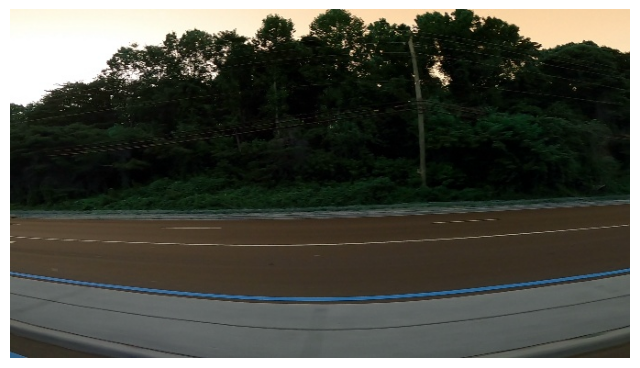


image 1/1 /kaggle/input/car-object-detection/data/testing_images/vid_5_25240.jpg: 384x640 (no detections), 10.7ms
Speed: 1.7ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)


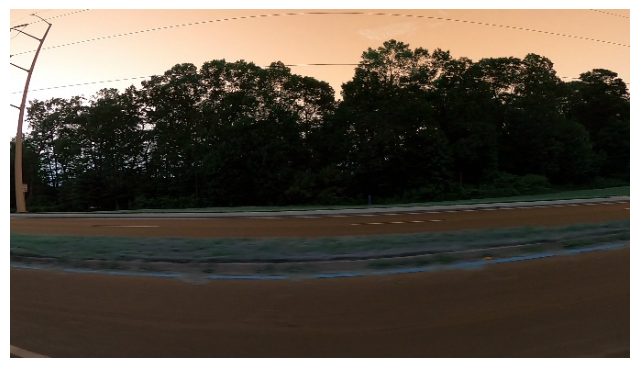


image 1/1 /kaggle/input/car-object-detection/data/testing_images/vid_5_29560.jpg: 384x640 1 car, 10.7ms
Speed: 1.8ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)


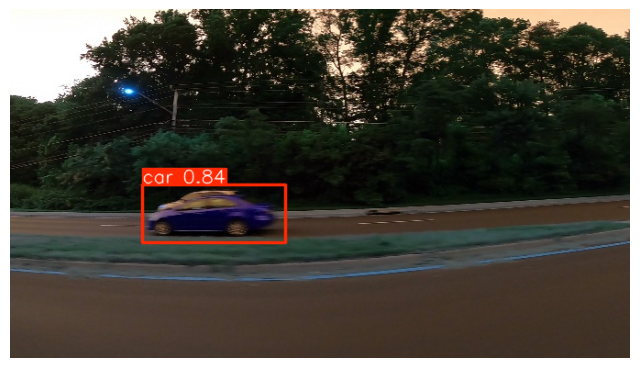


image 1/1 /kaggle/input/car-object-detection/data/testing_images/vid_5_29020.jpg: 384x640 1 car, 10.7ms
Speed: 1.7ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)


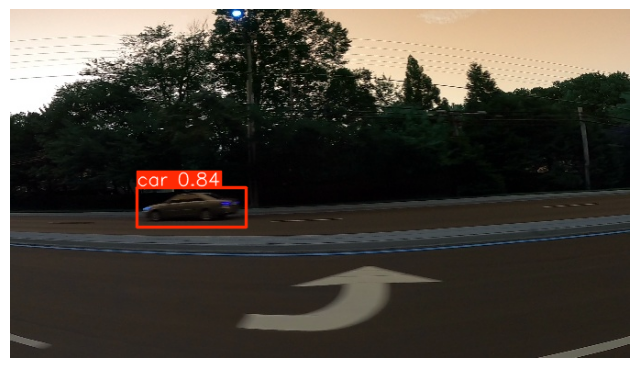


image 1/1 /kaggle/input/car-object-detection/data/testing_images/vid_5_30720.jpg: 384x640 (no detections), 10.7ms
Speed: 1.6ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)


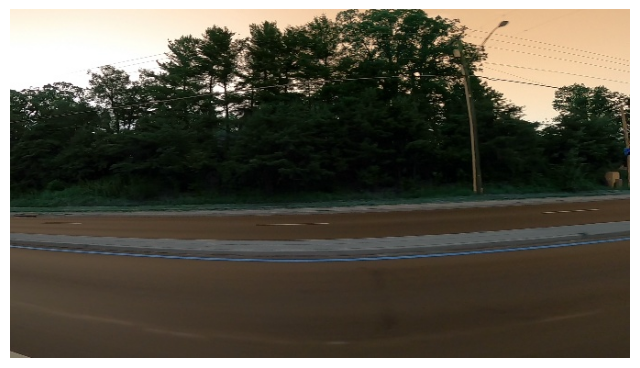


image 1/1 /kaggle/input/car-object-detection/data/testing_images/vid_5_26940.jpg: 384x640 2 cars, 10.7ms
Speed: 1.7ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)


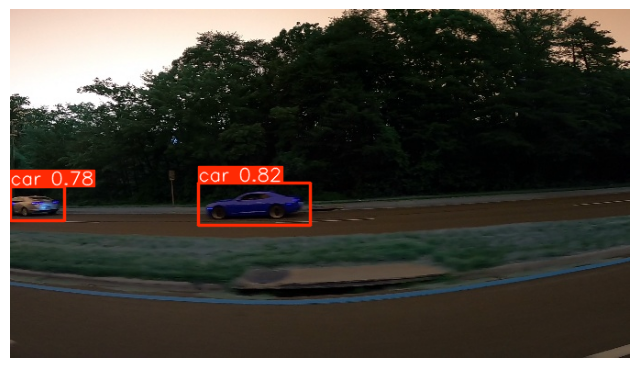


image 1/1 /kaggle/input/car-object-detection/data/testing_images/vid_5_31620.jpg: 384x640 1 car, 10.7ms
Speed: 1.7ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)


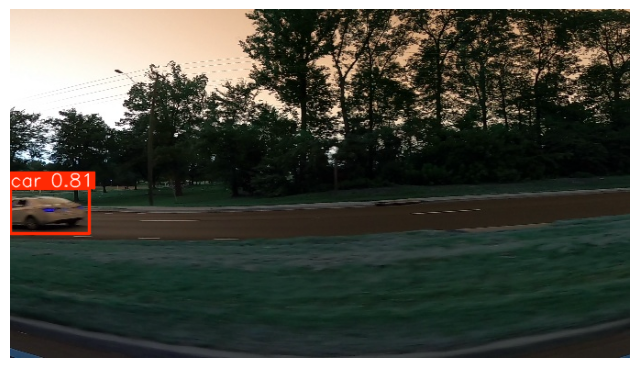


image 1/1 /kaggle/input/car-object-detection/data/testing_images/vid_5_31100.jpg: 384x640 1 car, 10.7ms
Speed: 1.8ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)


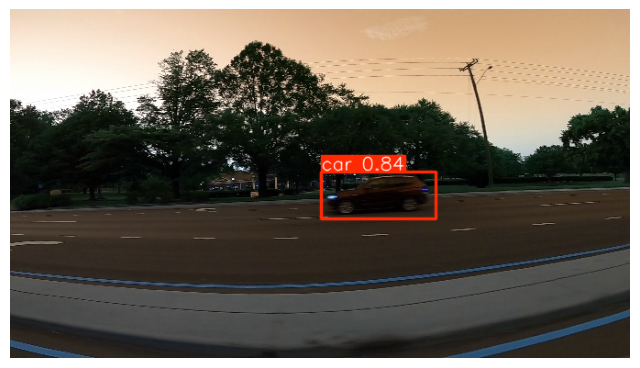


image 1/1 /kaggle/input/car-object-detection/data/testing_images/vid_5_31040.jpg: 384x640 4 cars, 10.7ms
Speed: 1.7ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)


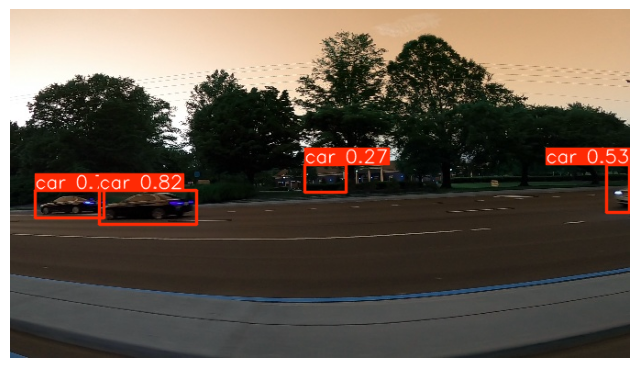


image 1/1 /kaggle/input/car-object-detection/data/testing_images/vid_5_31260.jpg: 384x640 (no detections), 10.8ms
Speed: 1.8ms preprocess, 10.8ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)


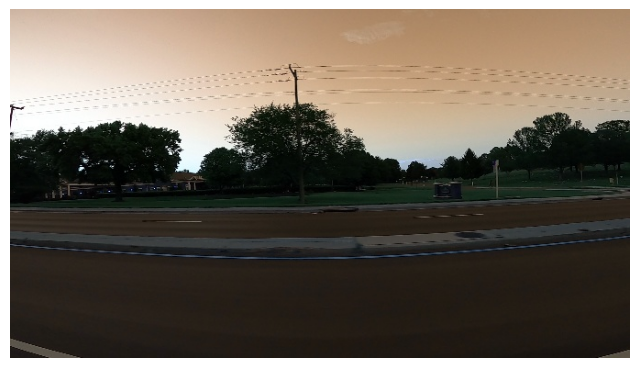


image 1/1 /kaggle/input/car-object-detection/data/testing_images/vid_5_29980.jpg: 384x640 (no detections), 10.7ms
Speed: 1.6ms preprocess, 10.7ms inference, 0.5ms postprocess per image at shape (1, 3, 384, 640)


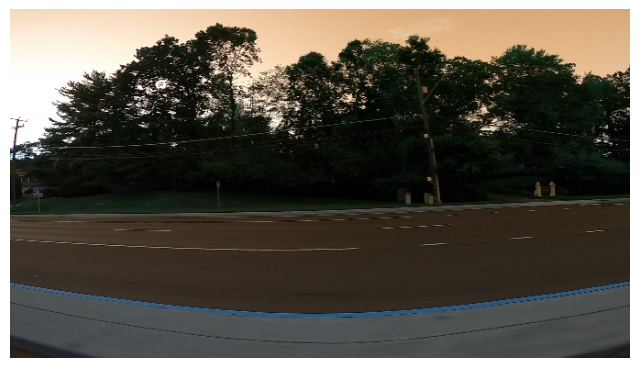


image 1/1 /kaggle/input/car-object-detection/data/testing_images/vid_5_26900.jpg: 384x640 2 cars, 10.7ms
Speed: 1.8ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)


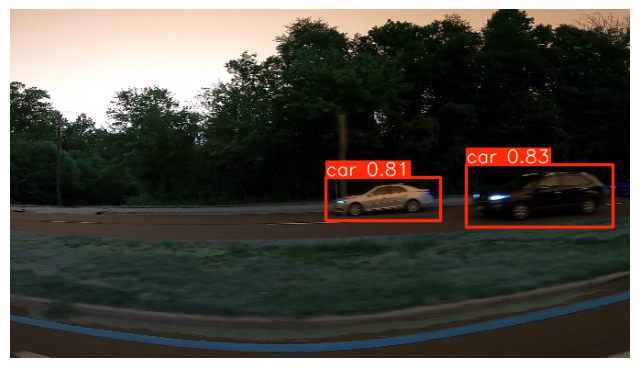


image 1/1 /kaggle/input/car-object-detection/data/testing_images/vid_5_29900.jpg: 384x640 (no detections), 10.7ms
Speed: 1.8ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)


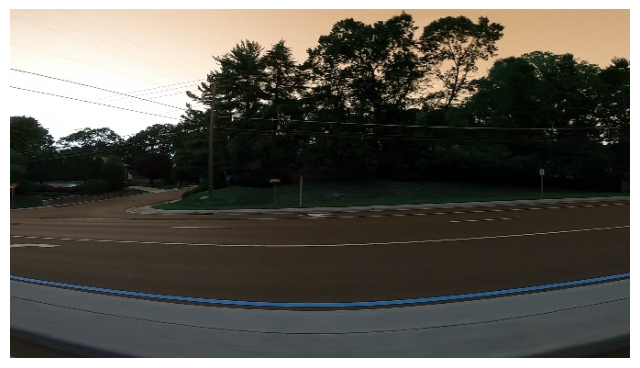


image 1/1 /kaggle/input/car-object-detection/data/testing_images/vid_5_30680.jpg: 384x640 (no detections), 10.7ms
Speed: 1.8ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)


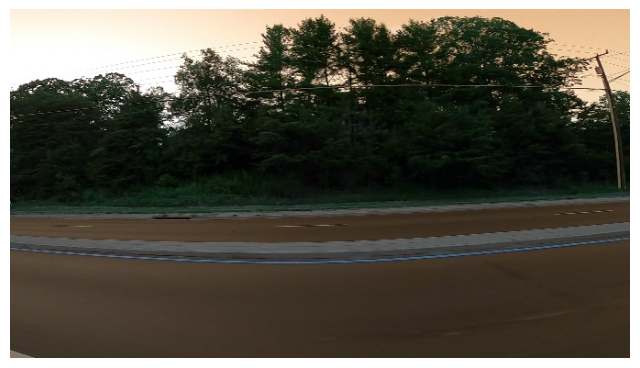


image 1/1 /kaggle/input/car-object-detection/data/testing_images/vid_5_26800.jpg: 384x640 3 cars, 10.7ms
Speed: 1.8ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)


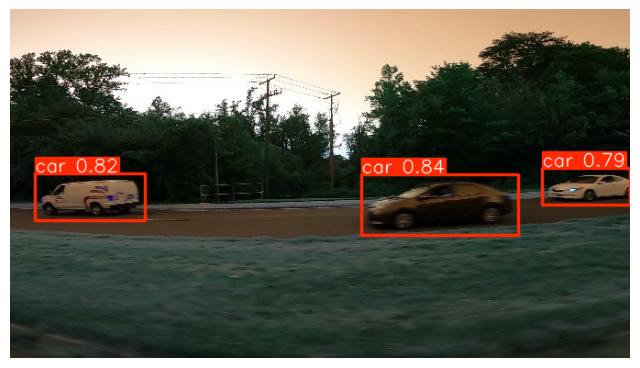


image 1/1 /kaggle/input/car-object-detection/data/testing_images/vid_5_30700.jpg: 384x640 (no detections), 10.7ms
Speed: 1.6ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)


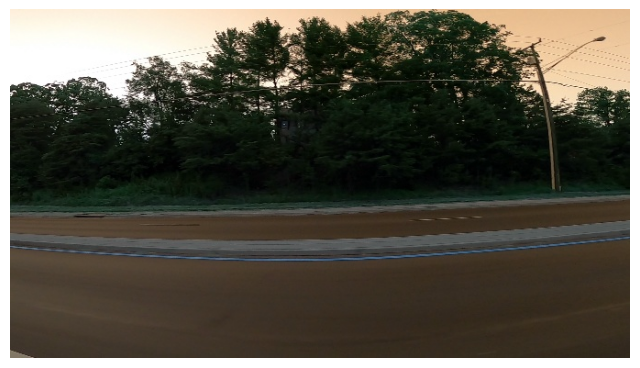


image 1/1 /kaggle/input/car-object-detection/data/testing_images/vid_5_26780.jpg: 384x640 2 cars, 10.7ms
Speed: 1.7ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)


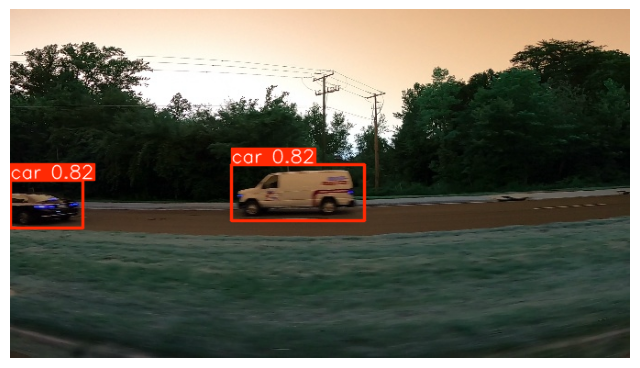


image 1/1 /kaggle/input/car-object-detection/data/testing_images/vid_5_28500.jpg: 384x640 1 car, 10.7ms
Speed: 1.7ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)


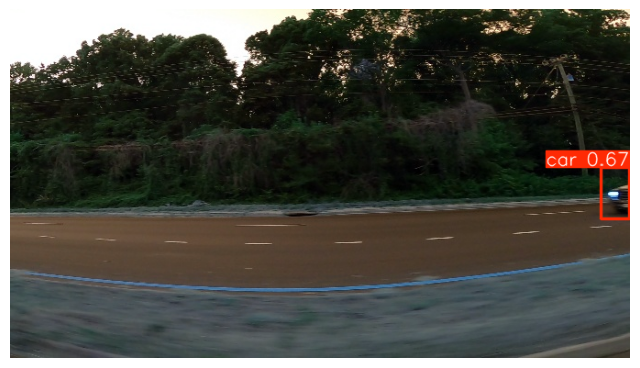


image 1/1 /kaggle/input/car-object-detection/data/testing_images/vid_5_27760.jpg: 384x640 (no detections), 10.7ms
Speed: 1.8ms preprocess, 10.7ms inference, 0.5ms postprocess per image at shape (1, 3, 384, 640)


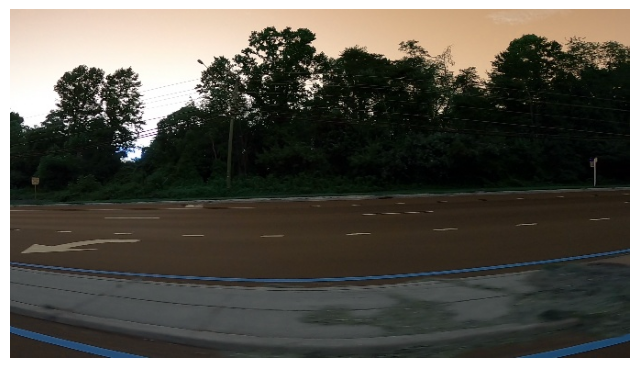


image 1/1 /kaggle/input/car-object-detection/data/testing_images/vid_5_27680.jpg: 384x640 (no detections), 10.7ms
Speed: 1.6ms preprocess, 10.7ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)


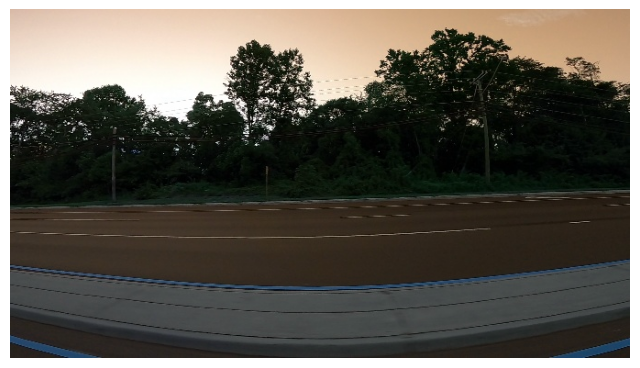


image 1/1 /kaggle/input/car-object-detection/data/testing_images/vid_5_26980.jpg: 384x640 (no detections), 10.7ms
Speed: 1.7ms preprocess, 10.7ms inference, 0.5ms postprocess per image at shape (1, 3, 384, 640)


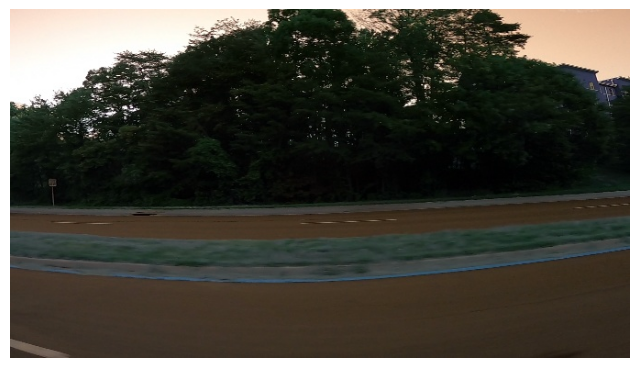


image 1/1 /kaggle/input/car-object-detection/data/testing_images/vid_5_27360.jpg: 384x640 2 cars, 10.7ms
Speed: 1.8ms preprocess, 10.7ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)


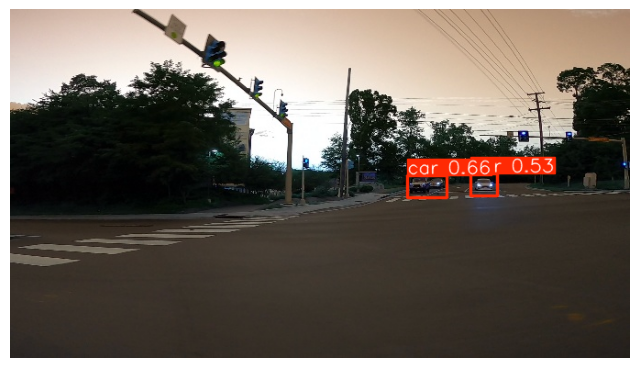


image 1/1 /kaggle/input/car-object-detection/data/testing_images/vid_5_31080.jpg: 384x640 2 cars, 10.8ms
Speed: 1.8ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)


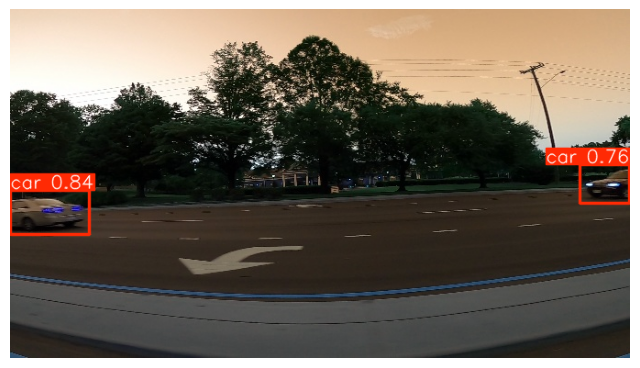


image 1/1 /kaggle/input/car-object-detection/data/testing_images/vid_5_30860.jpg: 384x640 1 car, 10.8ms
Speed: 1.7ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)


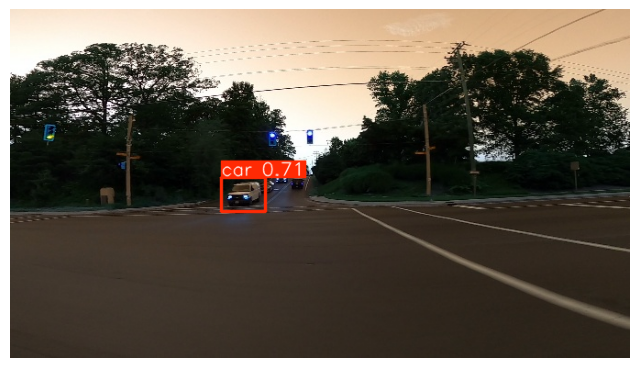


image 1/1 /kaggle/input/car-object-detection/data/testing_images/vid_5_26920.jpg: 384x640 2 cars, 10.7ms
Speed: 1.8ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)


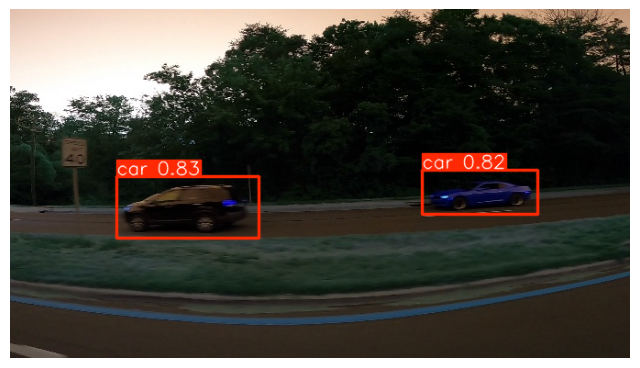


image 1/1 /kaggle/input/car-object-detection/data/testing_images/vid_5_30740.jpg: 384x640 1 car, 10.8ms
Speed: 1.6ms preprocess, 10.8ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)


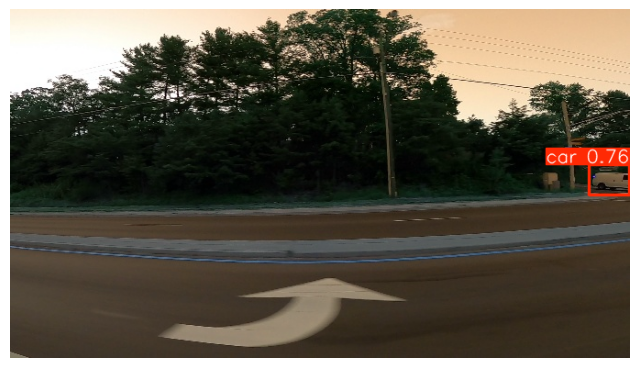


image 1/1 /kaggle/input/car-object-detection/data/testing_images/vid_5_26700.jpg: 384x640 2 cars, 10.8ms
Speed: 1.9ms preprocess, 10.8ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)


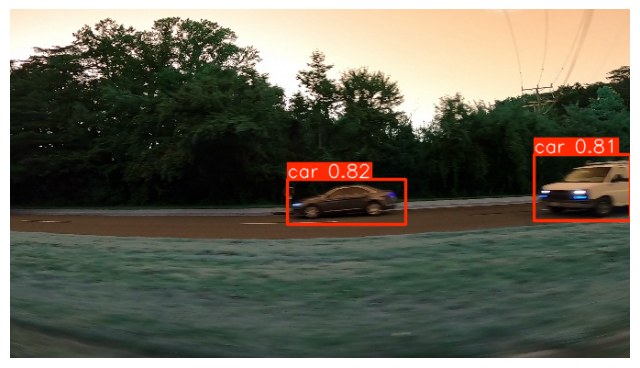


image 1/1 /kaggle/input/car-object-detection/data/testing_images/vid_5_26840.jpg: 384x640 1 car, 10.7ms
Speed: 1.7ms preprocess, 10.7ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)


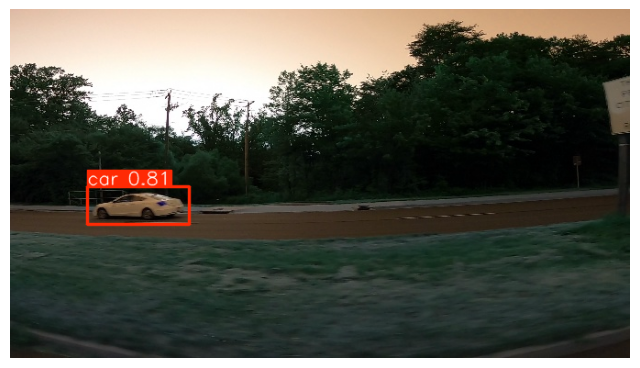

In [ ]:
image_dir = "/kaggle/input/car-object-detection/data/testing_images"

all_images = os.listdir(image_dir)
selected_images = all_images[:35]

for img_name in selected_images:
    img_path = os.path.join(image_dir, img_name)
    results = model.predict(img_path)
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    for result in results:
        plotted_img = result.plot()
        plt.figure(figsize=(8, 6))
        plt.imshow(plotted_img)

        plt.axis('off')
        plt.show()
